In [ ]:
# %cd /content/drive/MyDrive/20211/prj3/final-code-pytorch/data
# import transform
# transform.transform_masks()
# transform.transform_image()
# transform.transform_image_test()

/content/drive/MyDrive/20211/prj3/final-code-pytorch/data


In [1]:
%cd /content/drive/MyDrive/20211/prj3/final-code-pytorch

/content/drive/MyDrive/20211/prj3/final-code-pytorch


In [ ]:
# !python train.py

In [2]:
%load_ext tensorboard
%tensorboard --logdir=runs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# !python inference_color.py -m ./data/checkpoints/epoch_18.pth -i ./data/test/input_size_256 -o ./data/test/output

In [18]:
!python inference.py -m ./data/checkpoints/epoch_20.pth -i ./data/test/input_size_256 -o ./data/test/output_not_color


0it [00:00, ?it/s]
Predicting image 314fe384eb2ba3adfda6c1899fdc9837.png ...
1it [00:01,  1.37s/it]
Predicting image 26679bff55177a34fc01019eec999fd8.png ...
2it [00:02,  1.26s/it]
Predicting image 0619ebebe9e9c9d00a4262b4fe4a5a95.png ...
3it [00:03,  1.22s/it]
Predicting image 268d4b4ef4d95ceea11957998906d369.png ...
4it [00:04,  1.20s/it]
Predicting image 0a5f3601ad4f13ccf1f4b331a412fc44.png ...
5it [00:06,  1.19s/it]
Predicting image 0fca6a4248a41e8db8b4ed633b456aaa.png ...
6it [00:07,  1.19s/it]
Predicting image 0626ab4ec3d46e602b296cc5cfd263f1.png ...
7it [00:08,  1.19s/it]
Predicting image 1531871f2fd85a04faeeb2b535797395.png ...
8it [00:09,  1.18s/it]
Predicting image 1002ec4a1fe748f3085f1ce88cbdf366.png ...
9it [00:10,  1.18s/it]
Predicting image 1db239dda50f954ba59c7de13a35276a.png ...
10it [00:11,  1.18s/it]
Predicting image 0a0317371a966bf4b3466463a3c64db1.png ...
11it [00:13,  1.18s/it]
Predicting image 0af3feff05dec1eb3a70b145a7d8d3b6.png ...
12it [00:14,  1.18s/it]
Predic

In [22]:
RES_INPUT = "/content/drive/MyDrive/20211/prj3/final-code-pytorch/data/test/output_not_color"
RES_OUTPUT = "/content/drive/MyDrive/20211/prj3/final-code-pytorch/data/test/output_one"

In [24]:
import cv2 as cv
import os
from google.colab.patches import cv2_imshow
import numpy as np

def transform_mutil_to_one():
    images_folder = [os.path.join(RES_INPUT, f'{x}') for x in os.listdir(RES_INPUT)]
    for images_folder_path in images_folder:
        name_image =str(images_folder_path).split("/")[-1]
        
        image_0 = images_folder_path + "/"+ name_image+"_0.png"
        image_1 = images_folder_path + "/"+ name_image+"_1.png"
        image_2 = images_folder_path + "/"+ name_image+"_2.png"

        path_write = RES_OUTPUT +"/"+ name_image  +".png"

        image_0 = cv.imread(image_0, cv.IMREAD_COLOR)   # anh nay chi co 0 or 255    
        image_1 = cv.imread(image_1, cv.IMREAD_COLOR)
        image_2 = cv.imread(image_2, cv.IMREAD_COLOR)

        image_1 = cv.cvtColor(image_1,cv.COLOR_RGB2GRAY)
        # list_unique = np.unique(image_1)
        # print(list_unique)

        image_2 = cv.cvtColor(image_2,cv.COLOR_RGB2GRAY)
        # list_unique = np.unique(image_2)
        # print(list_unique)

        # print(image_1.shape)

        test = np.zeros((256,256,3), dtype=np.int64)   # why int 64 ?
        for i in range(255):
          for j in range(255):
            if image_1[i,j] == 255:
              test[i,j] = [0,0,255]
            if image_2[i,j] == 255:
              test[i,j] = [0,255,0] 
        
        # cv2_imshow(test)
        resized_img = cv.resize(test, (1280, 995), interpolation=cv.INTER_LINEAR_EXACT)

        cv.imwrite(path_write, resized_img)


In [25]:
transform_mutil_to_one()

In [15]:
import cv2 as cv
import cv2
import numpy as np
import pandas as pd
import os
import config
import numpy as np
import pandas as pd
import cv2
import os

def rle_to_string(runs):
    return ' '.join(str(x) for x in runs)

def rle_encode_one_mask(mask):
    pixels = mask.flatten()
    pixels[pixels > 0] = 255
    use_padding = False
    if pixels[0] or pixels[-1]:
        use_padding = True
        pixel_padded = np.zeros([len(pixels) + 2], dtype=pixels.dtype)
        pixel_padded[1:-1] = pixels
        pixels = pixel_padded
    
    rle = np.where(pixels[1:] != pixels[:-1])[0] + 2
    if use_padding:
        rle = rle - 1
    rle[1::2] = rle[1::2] - rle[:-1:2]
    return rle_to_string(rle)

def rle2mask(mask_rle, shape=(3,3)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (width,height) of array to return 
    Returns numpy array, 1 - mask, 0 - background
    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T

def mask2string(dir):
    ## mask --> string
    strings = []
    ids = []
    ws, hs = [[] for i in range(2)]
    for image_id in os.listdir(dir):
        id = image_id.split('.')[0]
        path = os.path.join(dir, image_id)
        img = cv2.imread(path)[:,:,::-1]
        h, w = img.shape[0], img.shape[1]
        for channel in range(2):
            ws.append(w)
            hs.append(h)
            ids.append(f'{id}_{channel}')
            string = rle_encode_one_mask(img[:,:,channel])
            strings.append(string)
    r = {
        'ids': ids,
        'strings': strings,
    }
    return r

dir = "/content/drive/MyDrive/20211/prj3/final-code-pytorch/data/test/output_one"
res = mask2string(dir)
df = pd.DataFrame(columns=['Id', 'Expected'])
df['Id'] = res['ids']
df['Expected'] = res['strings']

df.to_csv("/content/drive/MyDrive/20211/prj3/final-code-pytorch/data/test/output.csv", index=False)

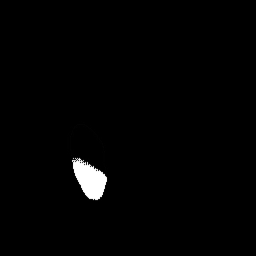

In [17]:
import cv2
image_new = cv2.imread("/content/drive/MyDrive/20211/prj3/final-code-v2/predict/6f67b5df7cdf3f33c3ca4d5060a633a8.jpeg")
image_new = cv2.resize(image_new,( 256,256))
from google.colab.patches import cv2_imshow
cv2_imshow(image_new[:,:,1])
